In [1]:
from pathlib import Path
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import math
import seaborn as sns
from collections import OrderedDict
sns.set()

# Preprocessing
from sklearn.preprocessing import QuantileTransformer
# Algorithms
from tslearn.clustering import TimeSeriesKMeans

DATA_DIR = Path('../data')
PROC_DIR = Path(DATA_DIR / 'original/processed')
OUT_DIR = Path('./out/kmeans')

if not OUT_DIR.exists():
    OUT_DIR.mkdir()

flow_columns = ['R [Rsun]', 'B [G]', 'alpha [deg]']

# Helper Functions

In [2]:
def plot_km_results(cluster_count, labels, series, save_path=None):
    plot_count = math.ceil(math.sqrt(cluster_count))
    fig, axs = plt.subplots(plot_count,plot_count,figsize=(25,25))
    fig.suptitle('Clusters')
    row_i=0
    column_j=0
    # For each label there is,
    # plots every series with that label
    for label in set(labels):
        cluster = []
        for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(series[i],c="gray",alpha=0.4)
                cluster.append(series[i])
        if len(cluster) > 0:
            axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
        axs[row_i, column_j].set_title("Cluster "+str(row_i*plot_count+column_j))
        column_j+=1
        if column_j%plot_count == 0:
            row_i+=1
            column_j=0
    plt.tight_layout()
    
    if save_path != None:
        plt.savefig(save_path, dpi=200)
        
    plt.show()
    
def plot_unscaled_clusters(labels, nclusters, flows_dict, columns, save_path=None):
    """Plot cluster of the original data (not scaled)"""  
    
    fig, axs = plt.subplots(nrows=nclusters, ncols=len(columns), figsize=(5*len(columns), 5*nclusters))
    for idx, flow in enumerate(flows_dict.values()):
        for col_pos, col in enumerate(columns):
            axs[(labels[idx], col_pos)].plot(flow[col], linewidth=0.5)
            axs[(labels[idx], col_pos)].set(ylabel=col)
            
    plt.tight_layout()
    
    if save_path != None:
        plt.savefig(save_path, dpi=200)
    plt.show()

# Load data

In [3]:
filenames = [f for f in PROC_DIR.iterdir()]

flows_dict = OrderedDict()
for f in filenames:
    flows_dict[f.stem] = pd.read_csv(f, skiprows=2, usecols=['R [Rsun]', 'B [G]', 'alpha [deg]'])
        
    

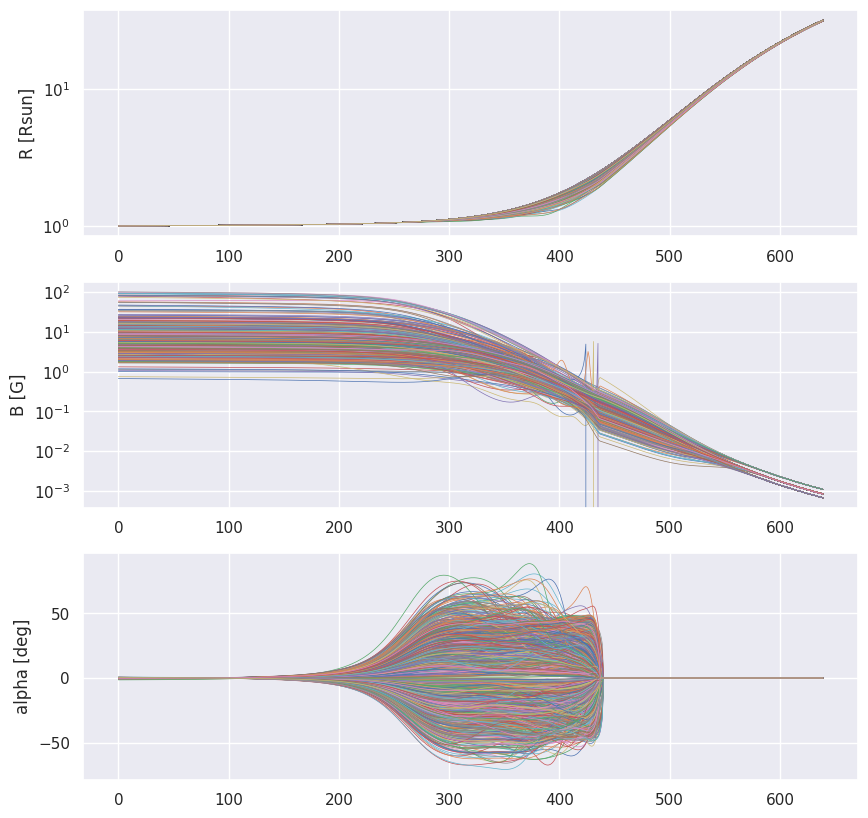

In [4]:
fig, axs = plt.subplots(3, 1, figsize=(10, 10))
for idx, col in enumerate(flow_columns):
    for series in flows_dict.values():
        axs[idx].plot(series.index, series[col], linewidth=0.5)
        
axs[0].set_ylabel('R [Rsun]')
axs[1].set_ylabel('B [G]')
axs[2].set_ylabel('alpha [deg]')

axs[0].set_yscale('log')
axs[1].set_yscale('log')
# axs[2].set_yscale('symlog')


## Scale Inputs

In [5]:
scaled_flows = pd.DataFrame()
scaler = QuantileTransformer(n_quantiles=1000, output_distribution='uniform')

for series in flows_dict.values():
    scaled_flows = pd.concat([scaled_flows, series], axis=0)

scaler.fit(scaled_flows)
scaled_flows = scaler.transform(scaled_flows)


scaled_flows = pd.DataFrame(scaled_flows, columns=flow_columns)
print(scaled_flows.shape)
print(scaled_flows.head())
# scaler.fit(scaled_flows)


(754560, 3)
   R [Rsun]     B [G]  alpha [deg]
0  0.000000  0.797180     0.208135
1  0.002002  0.797146     0.208697
2  0.003857  0.797112     0.209278
3  0.005005  0.797078     0.209846
4  0.007007  0.797044     0.210613


# Magnetic Field - B [G]

In [6]:
# separate into file series
scaled_magnetic = [scaled_flows['B [G]'][i*640 : i*640 + 640] for i in range(len(scaled_flows['B [G]']) // 640)]
scaled_magnetic = np.array(scaled_magnetic)
scaled_magnetic[0][:5]


array([0.79717954, 0.79714577, 0.79711196, 0.79707812, 0.79704424])

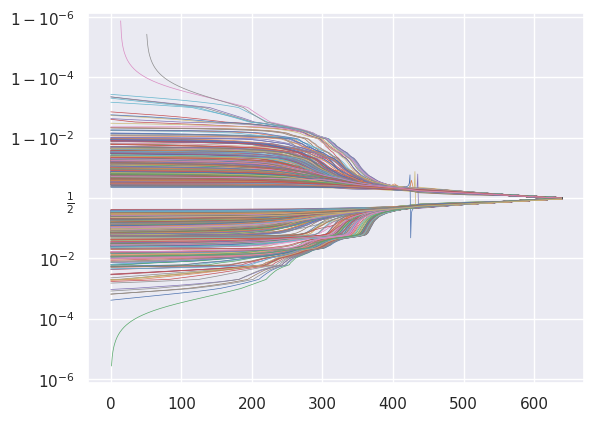

In [7]:
# plot scaled magnetic field
for b_line in scaled_magnetic:
    plt.plot(b_line, linewidth=0.5)

plt.yscale('logit')

## Time Series K-Means

In [8]:
# rule of thumb number of clusters 
cluster_count = math.ceil(math.sqrt(len(scaled_magnetic))) 
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="euclidean", max_iter=100, random_state=0)

mag_labels = km.fit_predict(scaled_magnetic)

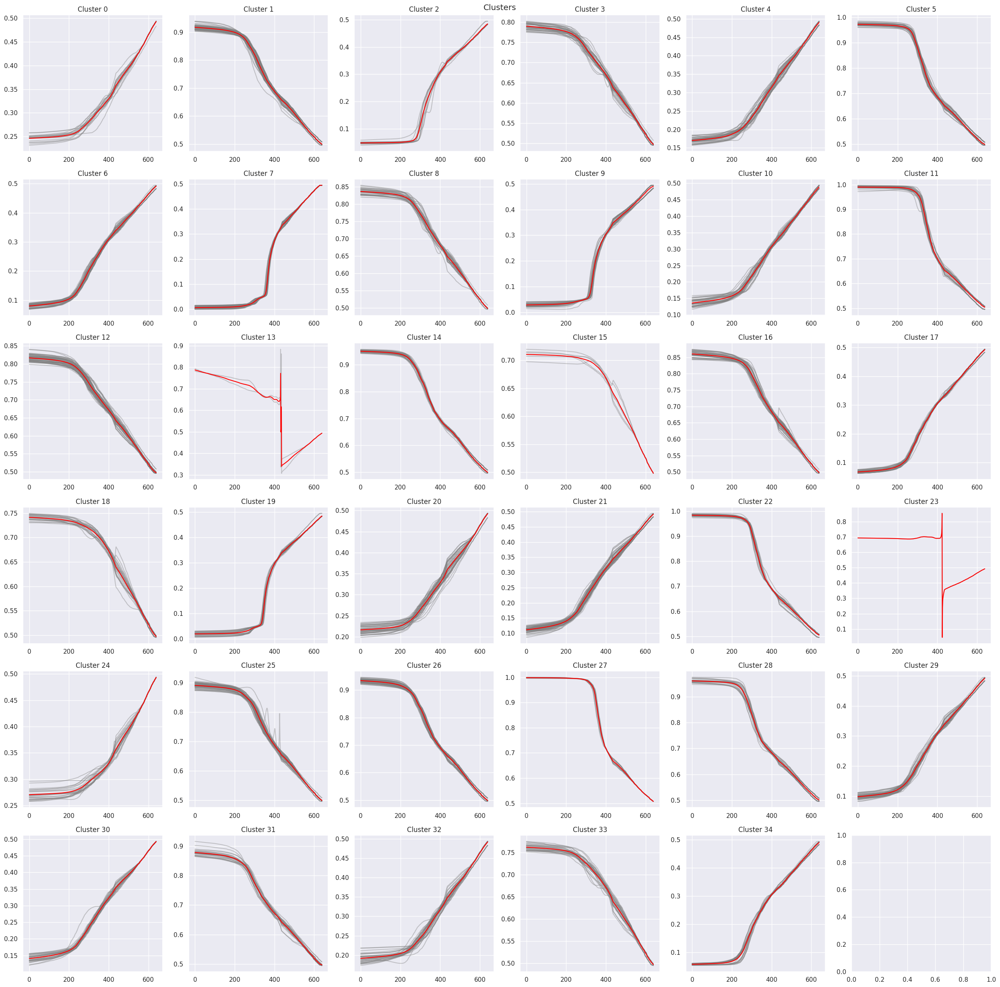

In [9]:
plot_km_results(cluster_count, mag_labels, scaled_magnetic)

### Original data clusters

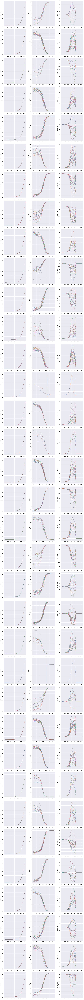

In [10]:
# display unscaled data into clusters
filenames = list(flows_dict.keys())
plot_unscaled_clusters(mag_labels, cluster_count, flows_dict, flow_columns)

### Cluster Distribution

[Text(0.5, 0, 'Cluster'), Text(0, 0.5, 'Number of files')]

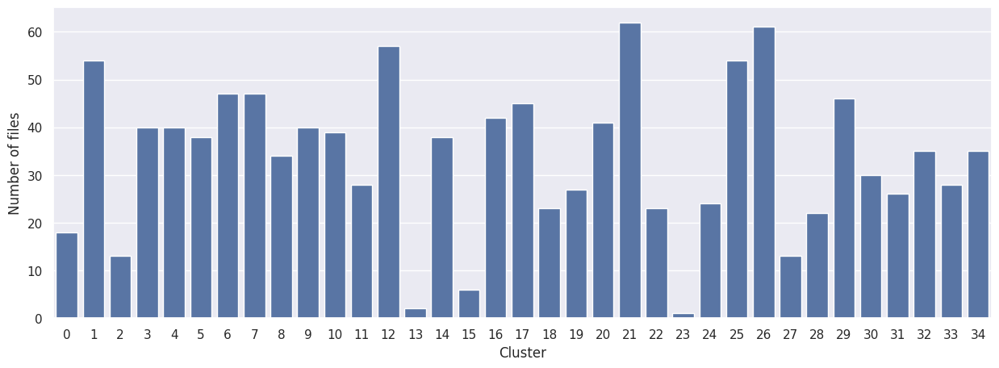

In [11]:
fig, ax = plt.subplots(figsize=(15, 5))
bp = sns.countplot(x=mag_labels, ax=ax, color='b')
bp.set(xlabel='Cluster', ylabel='Number of files')

In [14]:
%%capture
subdir = OUT_DIR / 'mag'
if not subdir.exists():
    subdir.mkdir()

for i in range(2, math.ceil(math.sqrt(len(scaled_magnetic)))):
    km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=100, random_state=0)
    mag_labels = km.fit_predict(scaled_magnetic)
    plot_km_results(i, mag_labels, scaled_magnetic, save_path=subdir / 'kmeans_{}.png'.format(i))
    plot_unscaled_clusters(mag_labels, i, flows_dict, flow_columns, save_path=subdir / 'kmeans_{}_unscaled.png'.format(i))

# Flux Tube Inclination - alpha [deg]

In [15]:
# separate into file series
scaled_alpha = [scaled_flows['alpha [deg]'][i*640 : i*640 + 640] for i in range(len(scaled_flows['alpha [deg]']) // 640)]
scaled_alpha = np.array(scaled_alpha)
scaled_alpha[0][:5]


array([0.20813473, 0.20869677, 0.20927757, 0.20984558, 0.21061282])

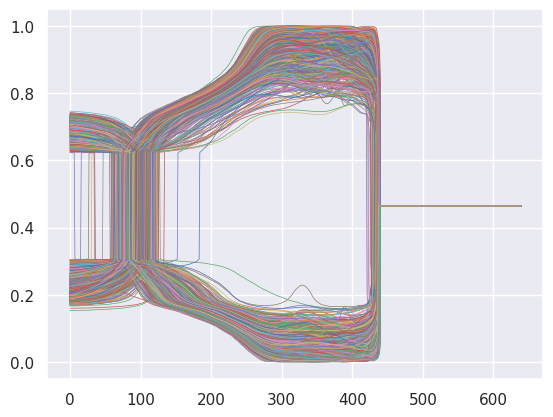

In [16]:
# plot scaled magnetic field
for a_line in scaled_alpha:
    plt.plot(a_line, linewidth=0.5)

plt.yscale('linear')

## K-Means

In [17]:
# rule of thumb number of clusters 
cluster_count = math.ceil(math.sqrt(len(scaled_alpha))) 
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="euclidean", max_iter=100, random_state=0)

alpha_labels = km.fit_predict(scaled_alpha)

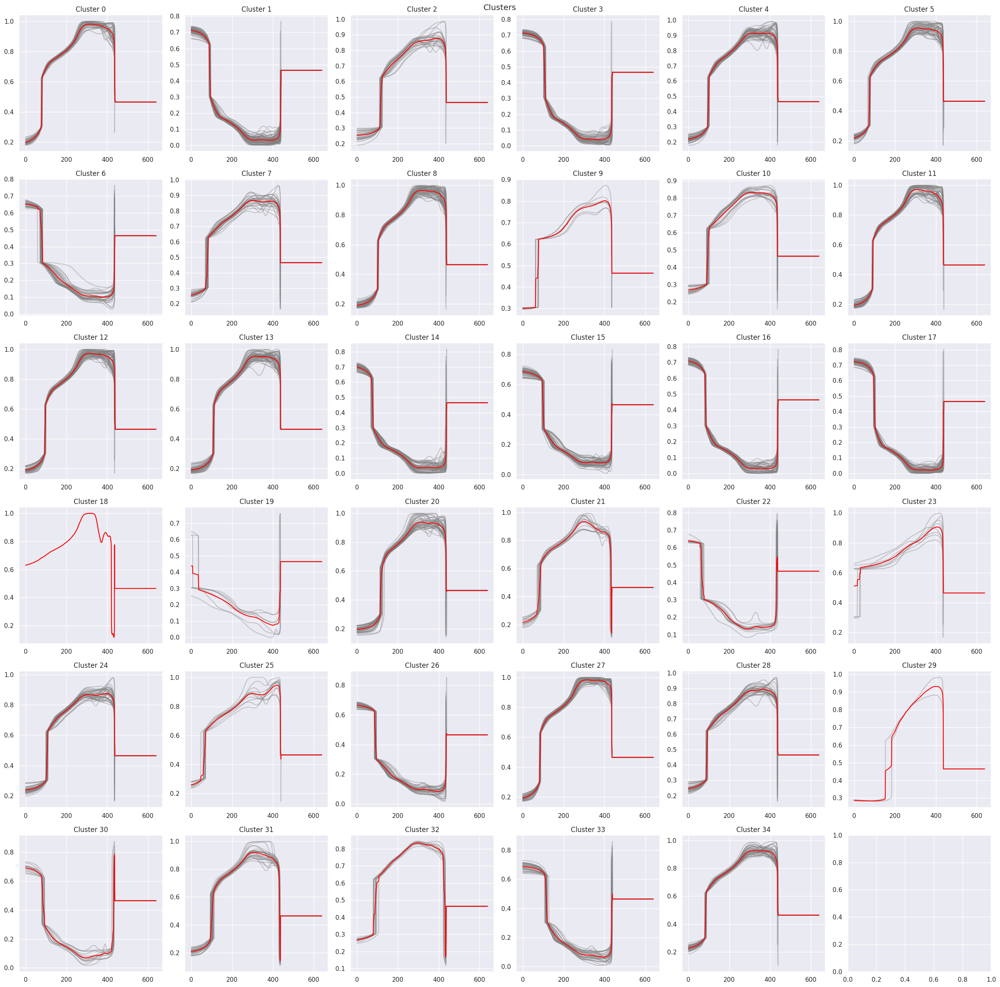

In [18]:
plot_km_results(cluster_count, alpha_labels, scaled_alpha)

### Original Data Clusters

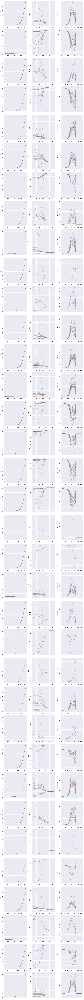

In [19]:
plot_unscaled_clusters(alpha_labels, cluster_count, flows_dict, flow_columns)

### Cluster Distribution

[Text(0.5, 0, 'Cluster'), Text(0, 0.5, 'Number of files')]

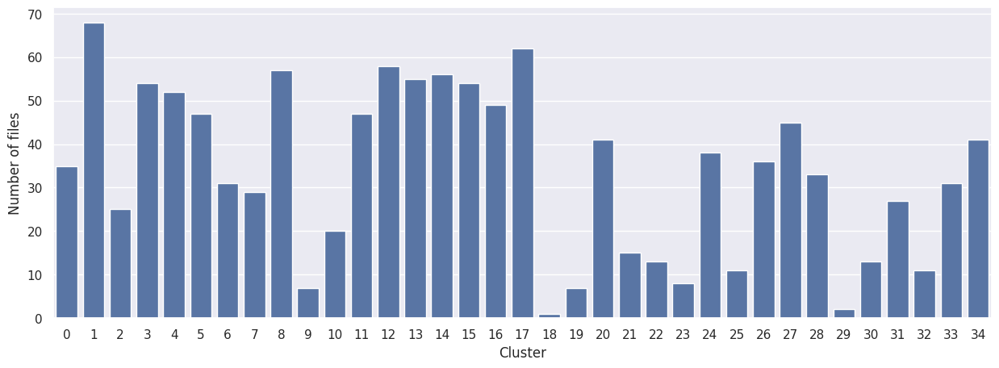

In [20]:
fig, ax = plt.subplots(figsize=(15, 5))
bp = sns.countplot(x=alpha_labels, ax=ax, color='b')
bp.set(xlabel='Cluster', ylabel='Number of files')

In [21]:
%%capture
subdir = OUT_DIR / 'alpha'
if not subdir.exists():
    subdir.mkdir()
    
for i in range(2, math.ceil(math.sqrt(len(scaled_magnetic)))):
    km = TimeSeriesKMeans(n_clusters=i, metric="euclidean", max_iter=100, random_state=0)
    mag_labels = km.fit_predict(scaled_magnetic)
    plot_km_results(i, mag_labels, scaled_magnetic, save_path=subdir / 'kmeans_{}.png'.format(i))
    plot_unscaled_clusters(mag_labels, i, flows_dict, flow_columns, save_path=subdir / 'kmeans_{}_unscaled.png'.format(i))